In [ ]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")
print("CUDA Available:", torch.cuda.is_available())
print("CUDA Version:", torch.version.cuda)
print("cuDNN Version:", torch.backends.cudnn.version())
print("Device Count:", torch.cuda.device_count())
print("Current Device:", torch.cuda.current_device())
print("Device Name:", torch.cuda.get_device_name(0) if torch.cuda.is_available() else "No GPU detected")

Using device: cuda
CUDA Available: True
CUDA Version: 12.1
cuDNN Version: 90100
Device Count: 1
Current Device: 0
Device Name: Tesla P100-PCIE-16GB


In [ ]:
!nvidia-smi

Sat Mar 29 10:26:53 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   39C    P0             27W /  250W |       3MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
import os
import shutil
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import AdamW
from torch.optim.lr_scheduler import OneCycleLR
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.sampler import WeightedRandomSampler
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter, defaultdict
from sklearn.model_selection import train_test_split, KFold
from sklearn.metrics import (accuracy_score, balanced_accuracy_score, recall_score,
                             f1_score, roc_auc_score, roc_curve, confusion_matrix,
                             classification_report, auc)
from sklearn.preprocessing import label_binarize
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
import albumentations as A
from albumentations.pytorch import ToTensorV2
from pytorch_lightning import LightningModule, Trainer, seed_everything
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from transformers import ViTModel

/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [ ]:
# Dataset Class
class SkinLesionDataset(Dataset):
    def __init__(self, csv_file, transform=None):
        if isinstance(csv_file, pd.DataFrame):
            self.data = csv_file
        else:
            self.data = pd.read_csv(csv_file)
        self.transform = transform
        self.domain_map = {
            'torso': 0, 'lower extremity': 1, 'upper extremity': 2, 'anterior torso': 3,
            'head/neck': 4, 'posterior torso': 5, 'palms/soles': 6, 'oral/genital': 7,
            'lateral torso': 8, 'unknown': 9
        }
        self.diagnosis_to_target = {
            'NV': 5, 'MEL': 4, 'BKL': 2, 'DF': 3, 'SCC': 6, 'BCC': 1, 'VASC': 8, 'AK': 0, 'UNK': 7
        }

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path = self.data.iloc[idx]['path']
        if not os.path.exists(img_path):
            raise ValueError(f"Error: Image at {img_path} not found.")
        image = cv2.imread(img_path)
        if image is None:
            raise ValueError(f"Error: Unable to read image at {img_path}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        label = int(self.data.iloc[idx]['target'])
        anatom_site = str(self.data.iloc[idx]['anatom_site_general']).lower()
        domain = self.domain_map.get(anatom_site, 9)
        if self.transform:
            augmented = self.transform(image=image)
            image = augmented["image"]
        return image, label, domain

In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

# Mean & std for normalization (ImageNet values)
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

# Improved training augmentations
train_transforms = A.Compose([
    A.LongestMaxSize(1024, p=1),
    A.PadIfNeeded(min_height=1024, min_width=1024, p=1, border_mode=cv2.BORDER_REFLECT_101, value=0),
    A.RandomResizedCrop(height=224, width=224, scale=(0.8, 1.0), ratio=(0.9, 1.1), interpolation=cv2.INTER_CUBIC, p=1),
    A.Rotate(limit=5, p=0.5),  # Reduced rotation
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Affine(scale=(0.98, 1.02), rotate=(-5, 5), shear=(-2, 2), p=0.5),  # Less distortion
    A.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.2, hue=0.05, p=0.5),  # Reduced color augmentation
    A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1, p=0.5),
    A.HueSaturationValue(hue_shift_limit=1, sat_shift_limit=10, val_shift_limit=15, p=0.5),
    A.ShiftScaleRotate(shift_limit=0.005, scale_limit=0.005, rotate_limit=10, border_mode=cv2.BORDER_REFLECT, p=0.5),  # Prevent extreme shifts
    A.OneOf([
        A.Blur(blur_limit=3, p=0.3),  # Keep mild blur only
        A.GaussNoise(var_limit=(5.0, 10.0), p=0.3),
    ], p=0.5),
    A.Normalize(mean=mean, std=std),
    ToTensorV2(),
])

# Validation (No heavy augmentation)
val_transforms = A.Compose([
    A.Resize(224, 224),
    A.Normalize(mean=mean, std=std),
    ToTensorV2()
])

# Test set transformations (same as validation)
test_transforms = val_transforms


In [ ]:
# Create dataset
dataset = SkinLesionDataset(csv_file="/kaggle/input/csvfile/whole_data_no_duplicates_kaggle.csv",transform=train_transforms)

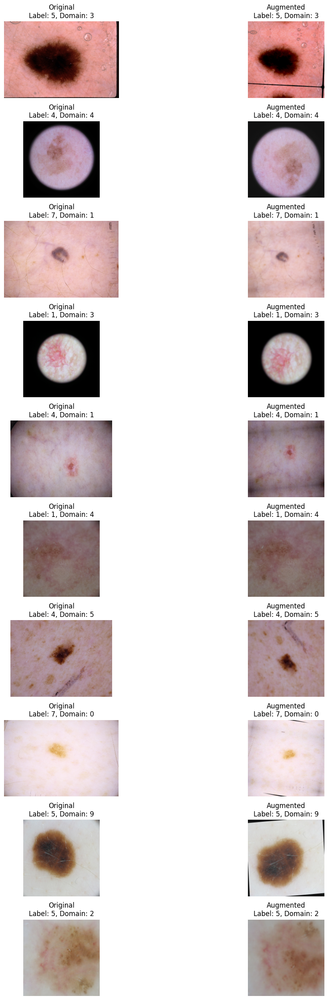

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np
import torch
import cv2

def denormalize(image, mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    """
    Converts a normalized image back to the [0, 1] range.
    """
    if isinstance(image, torch.Tensor):
        image = image.numpy().transpose(1, 2, 0)  # Convert (C, H, W) to (H, W, C)

    # Denormalize
    image = image * std + mean
    image = np.clip(image, 0, 1)  # Ensure values are in valid range

    return image

def visualize_augmentations(dataset, num_images=10):
    """
    Visualizes original and augmented images side by side.

    Args:
        dataset: The dataset object (instance of `SkinLesionDataset`).
        num_images: Number of images to display (default=10).
    """
    fig, axes = plt.subplots(num_images, 2, figsize=(15, num_images * 2.5))  # Each row has original & augmented image

    for i in range(num_images):
        idx = random.randint(0, len(dataset) - 1)

        # Load original image
        img_path = dataset.data.iloc[idx]['path']
        original_image = cv2.imread(img_path)
        original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

        # Load augmented image
        augmented_image, label, domain = dataset[idx]

        # Convert augmented image from tensor to NumPy
        if isinstance(augmented_image, torch.Tensor):
            augmented_image = denormalize(augmented_image)

        # Plot original image
        axes[i, 0].imshow(original_image)
        axes[i, 0].axis("off")
        axes[i, 0].set_title(f"Original\nLabel: {label}, Domain: {domain}")

        # Plot augmented image
        axes[i, 1].imshow(augmented_image)
        axes[i, 1].axis("off")
        axes[i, 1].set_title(f"Augmented\nLabel: {label}, Domain: {domain}")

    plt.subplots_adjust(hspace=0.5)  # Adjust spacing to prevent title overlap
    plt.tight_layout()
    plt.show()

# Call the function
visualize_augmentations(dataset, num_images=10)


In [ ]:
# Data Loaders
def collate_fn(batch):
    images = torch.stack([item[0] for item in batch])
    labels = torch.tensor([item[1] for item in batch], dtype=torch.long)
    domains = torch.tensor([item[2] for item in batch], dtype=torch.long)
    return images, labels, domains

In [ ]:
df = pd.read_csv("/kaggle/input/csvfile/whole_data_no_duplicates_kaggle.csv")
df["anatom_site_general"] = df["anatom_site_general"].fillna("unknown")
domain_labels = df["anatom_site_general"].values
train_val_df, test_df = train_test_split(df, test_size=0.1, stratify=domain_labels, random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["anatom_site_general"], random_state=42)
print(f"Train Size: {len(train_df)}, Val Size: {len(val_df)}, Test Size: {len(test_df)}")

train_dataset = SkinLesionDataset(train_df, transform=train_transforms)
val_dataset = SkinLesionDataset(val_df, transform=val_transforms)
test_dataset = SkinLesionDataset(test_df, transform=test_transforms)

Train Size: 41255, Val Size: 10314, Test Size: 5730


In [ ]:
domain_counts = Counter(train_df["anatom_site_general"])
total_samples = sum(domain_counts.values())
weights = {domain: total_samples / count for domain, count in domain_counts.items()}
train_sample_weights = [weights[domain] for domain in train_df["anatom_site_general"]]
train_sampler = WeightedRandomSampler(train_sample_weights, num_samples=len(train_sample_weights), replacement=False)

train_dataloader = DataLoader(train_dataset, batch_size=16, sampler=train_sampler, collate_fn=collate_fn, num_workers=2, pin_memory=True)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False, collate_fn=collate_fn, num_workers=2, pin_memory=True)
test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False, collate_fn=collate_fn, num_workers=2, pin_memory=True)
print(len(train_dataloader))
print(len(val_dataloader))
print(len(test_dataloader))

2579
645
359


In [ ]:
Cimport torch
import numpy as np
from collections import Counter

# Update class weights based on the training set distribution
class_counter = train_class_distribution
total_samples = sum(class_counter.values())  # 19,879

# Mapping class indices to diagnosis names
diagnosis_to_target = {
    'AK': 0,
    'BCC': 1,
    'BKL': 2,
    'DF': 3,
    'MEL': 4,
    'NV': 5,
    'SCC': 6,
    'VASC': 7,
    'UNK': 8
}

# Reverse mapping for printing
target_to_diagnosis = {v: k for k, v in diagnosis_to_target.items()}

# Step 1: Compute inverse frequency weights
num_classes = len(class_counter)  # 9 classes
inverse_weights = {cls: total_samples / (num_classes * count) for cls, count in class_counter.items()}

# Step 2: Normalize weights to range [1.0, 5.0]
min_weight = min(inverse_weights.values())
max_weight = max(inverse_weights.values())
normalized_weights = {
    cls: 1.0 + (weight - min_weight) * (5.0 - 1.0) / (max_weight - min_weight)
    for cls, weight in inverse_weights.items()
}

# Step 3: Adjust weights for clinical priorities
adjusted_weights = normalized_weights.copy()

# Prioritize MEL and SCC for clinical relevance
adjusted_weights[4] = 5.0  # MEL: High weight for critical class
adjusted_weights[6] = 4.5  # SCC: Slightly lower but still prioritized

# Cap weights for rare classes to prevent overemphasis
adjusted_weights[3] = min(adjusted_weights[3], 4.0)  # DF
adjusted_weights[7] = min(adjusted_weights[7], 4.0)  # VASC

# Reduce weight for dominant class (NV) to balance learning
adjusted_weights[5] = max(adjusted_weights[5], 1.2)  # NV: Ensure minimum influence

# Set UNK weight to emphasize out-of-distribution detection
adjusted_weights[8] = 3.0  # UNK: Moderate weight to ensure learning

# Step 4: Convert to tensor
class_weights_tensor = torch.tensor(
    [adjusted_weights[cls] for cls in sorted(class_counter.keys())], dtype=torch.float32
)

# Ensure no NaN or Inf values
assert not torch.isnan(class_weights_tensor).any(), "NaN detected in class weights!"
assert not torch.isinf(class_weights_tensor).any(), "Inf detected in class weights!"

# Print the adjusted class weights
print("\nAdjusted Class Weights for Focal Loss (Updated Training Set with UNK):")
for cls, weight in zip(sorted(class_counter.keys()), class_weights_tensor.numpy()):
    class_name = target_to_diagnosis.get(cls, f"Class {cls}")
    print(f"Class {cls} ({class_name}): Weight {weight:.4f}")

Adjusted Class Weights for Focal Loss:
Class 0 (AK): Weight 3.7479
Class 1 (BCC): Weight 2.7089
Class 2 (BKL): Weight 2.8361
Class 3 (DF): Weight 4.0000
Class 4 (MEL): Weight 5.0000
Class 5 (NV): Weight 1.5907
Class 6 (SCC): Weight 4.5000
Class 7 (UNK): Weight 1.3834
Class 8 (VASC): Weight 4.0000


In [ ]:
# Define Focal Loss
class FocalLoss(torch.nn.Module):
    def __init__(self, alpha=None, gamma=3, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha  # Class weights tensor
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        # Ensure alpha is on the same device as inputs
        if self.alpha is not None:
            self.alpha = self.alpha.to(inputs.device)

        # Compute cross-entropy loss
        ce_loss = F.cross_entropy(inputs, targets, reduction='none', weight=self.alpha)

        # Compute focal loss scaling factor
        probs = torch.softmax(inputs, dim=1)
        pt = probs.gather(1, targets.unsqueeze(1)).squeeze(1)  # Get predicted probability for correct class
        pt = torch.clamp(pt, min=1e-7, max=1-1e-7)  # Clamp to avoid extreme values
        focal_weight = (1 - pt) ** self.gamma  # Apply gamma scaling

        loss = focal_weight * ce_loss

        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        return loss  # Return per-sample loss if reduction='none'

In [ ]:
class BaseEvaluator:
    def __init__(self, class_labels, device=None, checkpoint_path=None, domain_map=None):
        self.class_labels = class_labels
        self.device = device if device else torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.checkpoint_path = checkpoint_path
        self.domain_map = domain_map or {
            'torso': 0, 'lower extremity': 1, 'upper extremity': 2, 'anterior torso': 3,
            'head/neck': 4, 'posterior torso': 5, 'palms/soles': 6, 'oral/genital': 7,
            'lateral torso': 8, 'unknown': 9
        }
        self.test_preds = []
        self.test_labels = []
        self.test_logits = []
        self.test_images = []
        self.test_losses = []
        self.model = None

    def load_model(self):
        if not self.checkpoint_path or not os.path.exists(self.checkpoint_path):
            raise FileNotFoundError(f"Checkpoint file not found at {self.checkpoint_path}")

        self.model = DomainAdaptiveViT(
            n_classes=len(self.class_labels),
            domain_map=self.domain_map,
            domain_embedding_dim=64,
            use_domain_adaptation=True,
            fixed_embeddings=True,
            class_weights_tensor=class_weights_tensor
        ).to(self.device)

        checkpoint = torch.load(self.checkpoint_path, map_location=self.device)
        state_dict = checkpoint.get('state_dict', checkpoint)
        state_dict = {k.replace('model.', ''): v for k, v in state_dict.items()}

        try:
            self.model.load_state_dict(state_dict)
            print("Checkpoint loaded successfully!")
        except RuntimeError as e:
            print(f"Error loading state dict: {e}")
            self.model.load_state_dict(state_dict, strict=False)
            print("Checkpoint loaded with strict=False.")
        self.model.eval()

    def test_step(self, model, batch):
        images, labels, domains = batch
        images = images.to(self.device)
        labels = labels.to(self.device)
        domains = domains.to(self.device)

        with torch.no_grad():
            logits = model(images, domains)
            loss = F.cross_entropy(logits, labels)
            preds = torch.argmax(logits, dim=1)
            acc = (preds == labels).float().mean()

        self.test_preds.append(preds.cpu())
        self.test_labels.append(labels.cpu())
        self.test_logits.append(logits.cpu())
        self.test_images.extend(images.cpu())
        self.test_losses.append(loss.item())

        print(f"Batch {len(self.test_preds)}: Collected {len(preds)} predictions")
        return {"test_loss": loss.item(), "test_acc": acc.item()}

    def compute_specificity(self, labels, preds, n_classes):
        cm = confusion_matrix(labels, preds, labels=np.arange(n_classes))
        specificity = []
        for i in range(n_classes):
            tn = cm.sum() - cm[i, :].sum() - cm[:, i].sum() + cm[i, i]
            fp = cm[:, i].sum() - cm[i, i]
            specificity.append(tn / (tn + fp) if (tn + fp) > 0 else 0.0)
        return specificity

    def evaluate(self, test_dataloader):
        if self.model is None:
            self.load_model()
        for batch_idx, batch in enumerate(test_dataloader):
            self.test_step(self.model, batch)
        self.on_test_epoch_end()

    def on_test_epoch_end(self):
        if not self.test_preds:
            print("Warning: No predictions were collected during testing!")
            return

        test_preds = torch.cat(self.test_preds).numpy()
        test_labels = torch.cat(self.test_labels).numpy()
        test_logits = torch.cat(self.test_logits).numpy()
        test_probs = F.softmax(torch.tensor(test_logits), dim=1).numpy()

        prob_sums = test_probs.sum(axis=1, keepdims=True)
        test_probs = test_probs / prob_sums
        test_probs = np.clip(test_probs, 1e-7, 1 - 1e-7)

        accuracy = accuracy_score(test_labels, test_preds)
        balanced_accuracy = balanced_accuracy_score(test_labels, test_preds)
        sensitivity = recall_score(test_labels, test_preds, average='macro', zero_division=0)
        specificity = self.compute_specificity(test_labels, test_preds, len(self.class_labels))
        dice_coefficient = f1_score(test_labels, test_preds, average='macro', zero_division=0)
        avg_loss = np.mean(self.test_losses) if self.test_losses else None

        try:
            auc_score = roc_auc_score(test_labels, test_probs, multi_class='ovr')
            print(f"Overall AUC: {auc_score:.4f}")
        except ValueError as e:
            print(f"Error computing AUC: {e}")
            auc_score = np.nan

        auc_scores_class = []
        for i in range(len(self.class_labels)):
            binary_labels = (test_labels == i).astype(int)
            if len(np.unique(binary_labels)) < 2:
                auc_scores_class.append(np.nan)
            else:
                per_class_auc = roc_auc_score(binary_labels, test_probs[:, i])
                auc_scores_class.append(per_class_auc)

        print("\nTest Metrics:")
        print(f"Accuracy: {accuracy:.4f}")
        print(f"Balanced Accuracy: {balanced_accuracy:.4f}")
        print(f"Sensitivity: {sensitivity:.4f}")
        print(f"Specificity: {[f'{s:.4f}' for s in specificity]}")
        print(f"Dice Coefficient: {dice_coefficient:.4f}")
        print(f"AUC: {auc_score:.4f}")
        print(f"Per-class AUC scores: {[f'{a:.4f}' if not np.isnan(a) else 'NaN' for a in auc_scores_class]}")
        if avg_loss is not None:
            print(f"Test Loss: {avg_loss:.4f}")

        self.plot_roc_curve(test_labels, test_probs)
        self.plot_confusion_matrix(test_labels, test_preds)
        self.plot_predicted_images(test_labels, test_preds)

    def plot_roc_curve(self, labels, probs):
        n_classes = probs.shape[1]
        labels_binarized = label_binarize(labels, classes=np.arange(n_classes))
        plt.figure(figsize=(8, 6))
        for i in range(n_classes):
            if len(np.unique(labels_binarized[:, i])) > 1:
                fpr, tpr, _ = roc_curve(labels_binarized[:, i], probs[:, i])
                roc_auc = auc(fpr, tpr)
                plt.plot(fpr, tpr, label=f"{self.class_labels[i]} (AUC: {roc_auc:.2f})")
        plt.plot([0, 1], [0, 1], 'k--', label="Random Guessing")
        plt.xlabel("False Positive Rate")
        plt.ylabel("True Positive Rate")
        plt.title("Multi-Class ROC Curve")
        plt.legend()
        plt.grid(True)
        plt.savefig("roc_curve.png")
        plt.show()

    def plot_confusion_matrix(self, labels, preds):
        cm = confusion_matrix(labels, preds)
        plt.figure(figsize=(10, 8))
        sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                    xticklabels=self.class_labels, yticklabels=self.class_labels)
        plt.xlabel("Predicted")
        plt.ylabel("True")
        plt.title("Confusion Matrix")
        plt.savefig("confusion_matrix.png")
        plt.show()

    def plot_predicted_images(self, labels, preds):
        print("\nPlotting first 10 images with predictions:")
        fig, axes = plt.subplots(2, 5, figsize=(15, 6))
        axes = axes.flatten()
        for i in range(min(10, len(self.test_images))):
            img = self.test_images[i].permute(1, 2, 0).numpy()
            img = (img - img.min()) / (img.max() - img.min())
            axes[i].imshow(img)
            true_class = self.class_labels[labels[i]]
            pred_class = self.class_labels[preds[i]]
            axes[i].set_title(f"True: {true_class}\nPred: {pred_class}")
            axes[i].axis('off')
        plt.tight_layout()
        plt.savefig("predicted_images.png")
        plt.show()

In [ ]:
import os
import shutil
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from collections import defaultdict
from torch.optim.lr_scheduler import OneCycleLR
from pytorch_lightning import LightningModule, Trainer, seed_everything
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from transformers import ViTModel
from sklearn.metrics import balanced_accuracy_score
import numpy as np

# Assuming FocalLoss and BaseEvaluator are defined elsewhere
# from your_module import FocalLoss, BaseEvaluator

class DomainAdaptiveAttention(nn.Module):
    def __init__(self, embed_dim, num_heads, domain_dim):
        super().__init__()
        self.embed_dim = embed_dim
        self.num_heads = num_heads
        self.domain_dim = domain_dim
        self.query = nn.Linear(embed_dim, embed_dim)
        self.key = nn.Linear(embed_dim, embed_dim)
        self.value = nn.Linear(embed_dim, embed_dim)
        self.domain_scaling = nn.Linear(domain_dim, num_heads)
        self.proj = nn.Linear(embed_dim, embed_dim)

    def forward(self, x, domain_embedding):
        batch_size, seq_len, embed_dim = x.shape
        q = self.query(x).view(batch_size, seq_len, self.num_heads, -1).permute(0, 2, 1, 3)
        k = self.key(x).view(batch_size, seq_len, self.num_heads, -1).permute(0, 2, 1, 3)
        v = self.value(x).view(batch_size, seq_len, self.num_heads, -1).permute(0, 2, 1, 3)
        domain_scaling = self.domain_scaling(domain_embedding).unsqueeze(-1).unsqueeze(-1)
        attn_scores = torch.matmul(q, k.transpose(-2, -1)) / torch.sqrt(torch.tensor(self.embed_dim / self.num_heads, dtype=torch.float32))
        attn_scores = attn_scores * domain_scaling
        attn_weights = F.softmax(attn_scores, dim=-1)
        attn_output = torch.matmul(attn_weights, v).permute(0, 2, 1, 3).contiguous().view(batch_size, seq_len, -1)
        return self.proj(attn_output)

class DomainAdaptiveViT(LightningModule):
    def __init__(self, n_classes, domain_map, domain_embedding_dim=64,
                 use_domain_adaptation=True, fixed_embeddings=True, class_weights_tensor=None):
        super().__init__()
        self.save_hyperparameters()
        self.n_classes = n_classes
        self.domain_map = domain_map
        self.domain_embedding_dim = domain_embedding_dim
        self.use_domain_adaptation = use_domain_adaptation
        self.fixed_embeddings = fixed_embeddings
        self.class_weights_tensor = class_weights_tensor if class_weights_tensor is not None else torch.ones(n_classes)

        # ViT Backbone
        try:
            self.vit = ViTModel.from_pretrained("google/vit-base-patch16-224-in21k")
            print(f"Successfully loaded pre-trained weights for ViT: {sum(p.numel() for p in self.vit.parameters())} parameters")
        except Exception as e:
            print(f"Failed to load pre-trained weights: {e}")
            self.vit = ViTModel.from_pretrained("google/vit-base-patch16-224-in21k", ignore_mismatched_sizes=True)


        # Domain-specific components
        if self.use_domain_adaptation:
            self.domain_embedding = nn.Embedding(len(domain_map), domain_embedding_dim)
            if self.fixed_embeddings:
                self.domain_embedding.weight.requires_grad = False
            self.domain_adaptive_attention = DomainAdaptiveAttention(
                embed_dim=768, num_heads=8, domain_dim=domain_embedding_dim
            )

        # Dropout and Classification Head
        self.dropout = nn.Dropout(0.5)
        self.fc = nn.Linear(768, n_classes)

        # Loss and Evaluator
        class_names = ['AK', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'SCC', 'UNK', 'VASC']
        self.loss_fn = FocalLoss(alpha=None, gamma=3, reduction='none')
        self.evaluator = BaseEvaluator(class_labels=class_names, device=self.device)

        # L2 regularization strength for domain embeddings
        self.l2_lambda = 1e-3  # Added for L2 regularization in DAT_Learned

        # Tracking (aligned with FCOS model script)
        self.training_losses = {domain: [] for domain in self.domain_map.values()}  # Stores per-sample losses
        self.validation_losses = {domain: [] for domain in self.domain_map.values()}
        self.domain_weights = defaultdict(lambda: 1.0, {domain: 1.0 for domain in domain_map.values()})
        self.train_losses, self.train_accuracies = [], []
        self.val_losses, self.val_accuracies = [], []
        self.val_balanced_accuracies = []  # Added for balanced accuracy tracking
        self.epoch_domain_train_losses = {domain: [] for domain in self.domain_map.values()}
        self.epoch_domain_val_losses = {domain: [] for domain in self.domain_map.values()}
        self.test_preds, self.test_labels, self.test_logits = [], [], []
        self.val_preds, self.val_labels = [], []  # For balanced accuracy computation

    def forward(self, x, domains):
        vit_output = self.vit(x).last_hidden_state
        if self.use_domain_adaptation:
            domain_embeddings = self.domain_embedding(domains)
            vit_output = self.domain_adaptive_attention(vit_output, domain_embeddings)
        pooled_output = vit_output.mean(dim=1)
        pooled_output = self.dropout(pooled_output)
        return self.fc(pooled_output)

    def check_disk_usage(self):
        total, used, free = shutil.disk_usage("/kaggle/working")
        print(f"Disk Usage: Total={total/1e9:.2f} GB, Used={used/1e9:.2f} GB, Free={free/1e9:.2f} GB")
        if free < 1e9:  # Less than 1 GB free
            print("Warning: Low disk space. Cleaning up unnecessary files.")
            if os.path.exists("/kaggle/working/checkpoints"):
                shutil.rmtree("/kaggle/working/checkpoints")
                print("Deleted checkpoints/ directory to free up space.")
            if os.path.exists("/kaggle/working/logs"):
                shutil.rmtree("/kaggle/working/logs")
                print("Deleted logs/ directory to free up space.")

    def training_step(self, batch, batch_idx):
        images, labels, domains = batch
        logits = self(images, domains)
        if torch.isnan(logits).any() or torch.isinf(logits).any():
            print("Logits contain NaN or inf values!")
            logits = torch.nan_to_num(logits, nan=0.0, posinf=1e6, neginf=-1e6)

        # Move class weights to device here
        loss_fn = FocalLoss(alpha=self.class_weights_tensor.to(images.device), gamma=3, reduction='none')
        per_sample_loss = loss_fn(logits, labels)
        per_sample_loss = torch.nan_to_num(per_sample_loss, nan=0.0, posinf=1e6, neginf=-1e6)

        # Record per-sample losses for each domain (aligned with FCOSModel)
        for idx in range(len(domains)):
            domain = domains[idx].item()
            self.training_losses[domain].append(per_sample_loss[idx].item())

        # Compute weighted loss (aligned with FCOSModel)
        if self.use_domain_adaptation:
            weighted_losses = []
            for idx in range(len(per_sample_loss)):
                domain = domains[idx].item()
                weighted_loss = per_sample_loss[idx] * self.domain_weights[domain]
                weighted_losses.append(weighted_loss)

            weighted_loss = torch.mean(torch.stack(weighted_losses))  # Average over batch size

            # Add L2 regularization for domain embeddings (only for DAT_Learned)
            if not self.fixed_embeddings:
                l2_reg = torch.tensor(0.0, device=self.device)
                for param in self.domain_embedding.parameters():
                    l2_reg += torch.norm(param, p=2)
                weighted_loss += self.l2_lambda * l2_reg
        else:
            weighted_loss = per_sample_loss.mean()

        preds = torch.argmax(logits, dim=1)
        train_acc = (preds == labels).float().mean().nan_to_num(0.0)
        self.log("train_loss", weighted_loss, on_step=False, on_epoch=True, prog_bar=True, logger=True)
        self.log("train_acc", train_acc, on_step=False, on_epoch=True, prog_bar=True, logger=True)
        return {"loss": weighted_loss, "train_acc": train_acc}

    def validation_step(self, batch, batch_idx):
        images, labels, domains = batch
        logits = self(images, domains)
        if torch.isnan(logits).any() or torch.isinf(logits).any():
            print("Validation logits contain NaN or inf values!")
            logits = torch.nan_to_num(logits, nan=0.0, posinf=1e6, neginf=-1e6)

        loss_fn = FocalLoss(alpha=self.class_weights_tensor.to(images.device), gamma=3, reduction='none')
        loss = loss_fn(logits, labels)
        for domain in torch.unique(domains):
            domain_mask = (domains == domain)
            if domain_mask.sum() > 0:
                domain_loss = loss[domain_mask].mean()
                if torch.isnan(domain_loss):
                    domain_loss = torch.tensor(0.0, device=self.device)
                self.validation_losses[domain.item()].append(domain_loss.item())

        preds = torch.argmax(logits, dim=1)
        # Collect predictions and labels for balanced accuracy
        self.val_preds.extend(preds.cpu().numpy())
        self.val_labels.extend(labels.cpu().numpy())

        val_acc = (preds == labels).float().mean()
        self.log("val_loss", loss.mean(), on_step=False, on_epoch=True, prog_bar=True, logger=True)
        self.log("val_acc", val_acc, on_step=False, on_epoch=True, prog_bar=True, logger=True)
        return {"val_loss": loss.mean(), "val_acc": val_acc}

    def on_train_epoch_end(self):
        train_loss = self.trainer.callback_metrics.get("train_loss")
        train_acc = self.trainer.callback_metrics.get("train_acc")
        if train_loss is not None:
            self.train_losses.append(train_loss.item())
        if train_acc is not None:
            self.train_accuracies.append(train_acc.item())

        print(f"\nEpoch {self.current_epoch} - Training Metrics:")
        print(f"Training Loss: {train_loss.item() if train_loss is not None else 'N/A'}")
        print(f"Training Accuracy: {train_acc.item() if train_acc is not None else 'N/A'}")

        # Compute and log per-domain training losses
        for domain, losses in self.training_losses.items():
            if len(losses) > 0:
                mean_loss = sum(losses) / len(losses)
                self.epoch_domain_train_losses[domain].append(mean_loss)
                print(f"Domain {domain}: Average Loss: {mean_loss}")
            else:
                self.epoch_domain_train_losses[domain].append(0.0)
                print(f"Domain {domain}: No losses recorded")

        # Clear training losses for the next epoch (aligned with FCOSModel)
        if self.current_epoch < self.trainer.max_epochs - 1:
            for domain in self.training_losses:
                self.training_losses[domain] = []

        print(f"\nLearning Rates at End of Epoch {self.current_epoch}:")
        for i, group in enumerate(self.trainer.optimizers[0].param_groups):
            print(f"Group {i}: LR: {group['lr']:.6f}")

    def on_validation_epoch_end(self):
        val_loss = self.trainer.callback_metrics.get("val_loss")
        val_acc = self.trainer.callback_metrics.get("val_acc")
        if val_loss is not None:
            self.val_losses.append(val_loss.item())
        if val_acc is not None:
            self.val_accuracies.append(val_acc.item())

        # Compute balanced accuracy
        if len(self.val_preds) > 0 and len(self.val_labels) > 0:
            val_balanced_acc = balanced_accuracy_score(self.val_labels, self.val_preds)
            self.log("val_balanced_acc", val_balanced_acc, on_step=False, on_epoch=True, prog_bar=True, logger=True)
            self.val_balanced_accuracies.append(val_balanced_acc)
            print(f"Validation Balanced Accuracy: {val_balanced_acc:.4f}")
        else:
            print("No predictions/labels recorded for balanced accuracy computation.")

        print(f"\nEpoch {self.current_epoch} - Validation Metrics:")
        print(f"Validation Loss: {val_loss.item() if val_loss is not None else 'N/A'}")
        print(f"Validation Accuracy: {val_acc.item() if val_acc is not None else 'N/A'}")

        if self.use_domain_adaptation:
            # Compute average domain losses
            domain_means = {}
            for domain, losses in self.training_losses.items():
                domain_means[domain] = torch.mean(torch.tensor(losses, device=self.device)) if losses else torch.tensor(1.0, device=self.device)
            # Compute domain weights using softmax
            exp_values = {domain: torch.exp(mean_loss) for domain, mean_loss in domain_means.items()}
            exp_sum = sum(exp_values.values())
            self.domain_weights = {domain: exp_val / exp_sum for domain, exp_val in exp_values.items()}

            print(f"Epoch {self.current_epoch}: Domain Weights -> {self.domain_weights}")
            for domain, weight in self.domain_weights.items():
                self.log(f"domain_{domain}_weight", weight, on_epoch=True, logger=True)

        # Compute validation domain losses
        for domain, losses in self.validation_losses.items():
            mean_loss = sum(losses) / len(losses) if losses else 0.0
            self.epoch_domain_val_losses[domain].append(mean_loss)
            self.log(f"domain_{domain}_loss", mean_loss, on_epoch=True, logger=True)
            print(f"Domain {domain}: Mean Loss: {mean_loss}")

        # Clear validation losses for the next epoch
        if self.current_epoch < self.trainer.max_epochs - 1:
            for domain in self.validation_losses:
                self.validation_losses[domain] = []

        # Clear predictions and labels for balanced accuracy
        self.val_preds = []
        self.val_labels = []

        # Check disk usage
        self.check_disk_usage()

    def configure_optimizers(self):
        base_lr = 1e-4
        decay_factor = 0.9
        optimizer_grouped_parameters = []

        # Classification Head
        optimizer_grouped_parameters.append({
            "params": self.fc.parameters(),
            "lr": base_lr,
            "initial_lr": base_lr,
            "name": "fc"
        })

        # ViT Encoder Layers
        num_layers = len(self.vit.encoder.layer)
        for i, layer in enumerate(self.vit.encoder.layer):
            layer_lr = base_lr * (decay_factor ** (num_layers - 1 - i))
            optimizer_grouped_parameters.append({
                "params": layer.parameters(),
                "lr": layer_lr,
                "initial_lr": base_lr,
                "name": f"vit.encoder.layer.{i}"
            })

        # Domain Adaptation Components
        if self.use_domain_adaptation:
            domain_attention_lr = base_lr * (decay_factor ** num_layers)
            optimizer_grouped_parameters.append({
                "params": self.domain_adaptive_attention.parameters(),
                "lr": domain_attention_lr,
                "initial_lr": domain_attention_lr,
                "name": "domain_adaptive_attention"
            })

            domain_embedding_lr = base_lr * (decay_factor ** (num_layers + 1))
            if not self.fixed_embeddings:
                optimizer_grouped_parameters.append({
                    "params": self.domain_embedding.parameters(),
                    "lr": domain_embedding_lr,
                    "initial_lr": domain_embedding_lr,
                    "name": "domain_embedding"
                })

        # ViT Embeddings
        vit_embeddings_lr = base_lr * (decay_factor ** (num_layers + 2))
        optimizer_grouped_parameters.append({
            "params": self.vit.embeddings.parameters(),
            "lr": vit_embeddings_lr,
            "initial_lr": vit_embeddings_lr,
            "name": "vit.embeddings"
        })

        optimizer = optim.AdamW(optimizer_grouped_parameters, weight_decay=3e-2)

        print("Intended Learning Rates (Before Scheduler):")
        for group in optimizer_grouped_parameters:
            print(f"Layer: {group['name']}, LR: {group['lr']:.6f}")

        print("\nOptimizer Param Groups (Before Scheduler):")
        for i, group in enumerate(optimizer.param_groups):
            print(f"Group {i}: LR: {group['lr']:.6f}, Params: {len(group['params'])}")

        max_lrs = [group['lr'] for group in optimizer_grouped_parameters]
        num_batches_per_epoch = len(self.trainer.train_dataloader) if self.trainer.train_dataloader else 2579
        total_steps = self.trainer.max_epochs * num_batches_per_epoch
        scheduler = OneCycleLR(
            optimizer,
            max_lr=max_lrs,
            total_steps=total_steps,
            pct_start=0.1,
            anneal_strategy='cos',
            div_factor=25.0,
            final_div_factor=1e4
        )

        print("\nInitial Learning Rates (After Scheduler Initialization):")
        for i, group in enumerate(optimizer.param_groups):
            print(f"Group {i}: LR: {group['lr']:.6f}, Params: {len(group['params'])}")

        print("\nMax Learning Rates (Scheduler):")
        for i, lr in enumerate(max_lrs):
            print(f"Group {i}: Max LR: {lr:.6f}")

        return {
            "optimizer": optimizer,
            "lr_scheduler": {"scheduler": scheduler, "interval": "step"}
        }

    def test_step(self, batch, batch_idx):
        return self.evaluator.test_step(self, batch)

    def on_test_epoch_end(self):
        self.evaluator.on_test_epoch_end()

    def on_save_checkpoint(self, checkpoint):
        checkpoint['train_losses'] = self.train_losses
        checkpoint['train_accuracies'] = self.train_accuracies
        checkpoint['val_losses'] = self.val_losses
        checkpoint['val_accuracies'] = self.val_accuracies
        checkpoint['val_balanced_accuracies'] = self.val_balanced_accuracies
        checkpoint['epoch_domain_train_losses'] = self.epoch_domain_train_losses
        checkpoint['epoch_domain_val_losses'] = self.epoch_domain_val_losses

    def on_load_checkpoint(self, checkpoint):
        self.train_losses = checkpoint.get('train_losses', [])
        self.train_accuracies = checkpoint.get('train_accuracies', [])
        self.val_losses = checkpoint.get('val_losses', [])
        self.val_accuracies = checkpoint.get('val_accuracies', [])
        self.val_balanced_accuracies = checkpoint.get('val_balanced_accuracies', [])
        self.epoch_domain_train_losses = checkpoint.get('epoch_domain_train_losses', {domain: [] for domain in self.domain_map.values()})
        self.epoch_domain_val_losses = checkpoint.get('epoch_domain_val_losses', {domain: [] for domain in self.domain_map.values()})

In [ ]:
domain_map = {
    'torso': 0,
    'lower extremity': 1,
    'upper extremity': 2,
    'anterior torso': 3,
    'head/neck': 4,
    'posterior torso': 5,
    'palms/soles': 6,
    'oral/genital': 7,
    'lateral torso': 8,
    'unknown': 9  # Add this line
}

# Create model
model = DomainAdaptiveViT(
    n_classes=9,
    domain_map=domain_map,
    domain_embedding_dim=64,
    use_domain_adaptation=True,
    fixed_embeddings=True,
    class_weights_tensor=class_weights_tensor
)

config.json:   0%|          | 0.00/502 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Successfully loaded pre-trained weights for ViT: 86389248 parameters


In [ ]:
import os
import shutil
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from collections import defaultdict
from torch.optim.lr_scheduler import OneCycleLR
from pytorch_lightning import LightningModule, Trainer, seed_everything
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping
from pytorch_lightning.loggers import TensorBoardLogger
from transformers import ViTModel

# Training Script
seed_everything(25081993)

NET_FOLDER = 'skin_lesion_model_dat_fixed'
BEST_WEIGHTS_FILE = 'best_model'
LAST_WEIGHTS_FILE = 'last_model'

# Ensure the directory exists
if not os.path.exists(NET_FOLDER):
    os.makedirs(NET_FOLDER, mode=0o777)


# Initialize the model
model = DomainAdaptiveViT(
    n_classes=9,
    domain_map=domain_map,
    domain_embedding_dim=64,
    use_domain_adaptation=True,
    fixed_embeddings=True,
    class_weights_tensor=class_weights_tensor
)

# Load the last checkpoint if it exists (for resuming training)
last_checkpoint_path = os.path.join(NET_FOLDER, f"{LAST_WEIGHTS_FILE}.ckpt")
if os.path.exists(last_checkpoint_path):
    print(f"Resuming training from last checkpoint: {last_checkpoint_path}")
    checkpoint = torch.load(last_checkpoint_path, map_location=lambda storage, loc: storage)
    model.load_state_dict(checkpoint['state_dict'], strict=False)
else:
    # Load the best checkpoint if it exists (for starting fresh)
    best_checkpoint_path = os.path.join(NET_FOLDER, f"{BEST_WEIGHTS_FILE}.ckpt")
    if os.path.exists(best_checkpoint_path):
        print(f"Loading best pre-trained weights from {best_checkpoint_path}")
        checkpoint = torch.load(best_checkpoint_path, map_location=lambda storage, loc: storage)
        model.load_state_dict(checkpoint['state_dict'], strict=False)
    else:
        print(f"No pre-trained weights found. Training from scratch.")

'''# Early stopping (monitoring val_balanced_acc)
early_stop_callback = EarlyStopping(
    monitor='val_balanced_acc',
    min_delta=0.00,
    patience=5,
    verbose=True,
    mode='max'
)'''

# Checkpointing for the best model (based on val_balanced_acc)
best_checkpoint_callback = ModelCheckpoint(
    monitor="val_balanced_acc",
    dirpath=NET_FOLDER,
    filename=BEST_WEIGHTS_FILE,
    mode="max",
    save_weights_only=False  # Save full checkpoint
)

# Checkpointing for the last model (saves at the end of every epoch)
last_checkpoint_callback = ModelCheckpoint(
    dirpath=NET_FOLDER,
    filename=LAST_WEIGHTS_FILE,
    save_top_k=-1,  # Save all checkpoints (we'll overwrite the last one each epoch)
    every_n_epochs=1,  # Save at the end of every epoch
    save_weights_only=False  # Save full checkpoint
)

# Logger
logger = TensorBoardLogger("logs", name="skin_lesion_model_dat_fixed")

# Trainer with mixed precision and gradient clipping
trainer = Trainer(
    accelerator='gpu',
    max_epochs=18,
    precision="16-mixed",  # Added for training efficiency
    deterministic=False,
    callbacks=[best_checkpoint_callback, last_checkpoint_callback],
    gradient_clip_val=1.0,  # Added for training stability
    gradient_clip_algorithm="norm",
    num_sanity_val_steps=0,
    logger=logger
)

# Run training (assuming train_dataloader and val_dataloader are defined)
trainer.fit(model, train_dataloader, val_dataloader)

Successfully loaded pre-trained weights for ViT: 86389248 parameters
No pre-trained weights found. Training from scratch.
Intended Learning Rates (Before Scheduler):
Layer: fc, LR: 0.000100
Layer: vit.encoder.layer.0, LR: 0.000031
Layer: vit.encoder.layer.1, LR: 0.000035
Layer: vit.encoder.layer.2, LR: 0.000039
Layer: vit.encoder.layer.3, LR: 0.000043
Layer: vit.encoder.layer.4, LR: 0.000048
Layer: vit.encoder.layer.5, LR: 0.000053
Layer: vit.encoder.layer.6, LR: 0.000059
Layer: vit.encoder.layer.7, LR: 0.000066
Layer: vit.encoder.layer.8, LR: 0.000073
Layer: vit.encoder.layer.9, LR: 0.000081
Layer: vit.encoder.layer.10, LR: 0.000090
Layer: vit.encoder.layer.11, LR: 0.000100
Layer: domain_adaptive_attention, LR: 0.000028
Layer: vit.embeddings, LR: 0.000023

Optimizer Param Groups (Before Scheduler):
Group 0: LR: 0.000100, Params: 2
Group 1: LR: 0.000031, Params: 16
Group 2: LR: 0.000035, Params: 16
Group 3: LR: 0.000039, Params: 16
Group 4: LR: 0.000043, Params: 16
Group 5: LR: 0.00004

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.3309

Epoch 0 - Validation Metrics:
Validation Loss: 1.1504288911819458
Validation Accuracy: 0.7766143083572388
Epoch 0: Domain Weights -> {0: tensor(0.0117, device='cuda:0'), 1: tensor(0.0215, device='cuda:0'), 2: tensor(0.0290, device='cuda:0'), 3: tensor(0.0583, device='cuda:0'), 4: tensor(0.1344, device='cuda:0'), 5: tensor(0.0664, device='cuda:0'), 6: tensor(0.1627, device='cuda:0'), 7: tensor(0.1432, device='cuda:0'), 8: tensor(0.3354, device='cuda:0'), 9: tensor(0.0374, device='cuda:0')}
Domain 0: Mean Loss: 0.1887407623911713
Domain 1: Mean Loss: 1.0956883707470961
Domain 2: Mean Loss: 1.161547843066454
Domain 3: Mean Loss: 2.0393115814125067
Domain 4: Mean Loss: 3.00466808427638
Domain 5: Mean Loss: 1.2923986940244543
Domain 6: Mean Loss: 0.5154220156035707
Domain 7: Mean Loss: 0.8993273710511858
Domain 8: Mean Loss: 1.5026945662167337
Domain 9: Mean Loss: 1.0749376214614832
Disk Usage: Total=20.96 GB, Used=0.00 GB, Free=20.94 GB

Epoch 0 - Trai

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.5475

Epoch 1 - Validation Metrics:
Validation Loss: 0.630698025226593
Validation Accuracy: 0.7618770599365234
Epoch 1: Domain Weights -> {0: tensor(0.0510, device='cuda:0'), 1: tensor(0.0783, device='cuda:0'), 2: tensor(0.0853, device='cuda:0'), 3: tensor(0.1148, device='cuda:0'), 4: tensor(0.1844, device='cuda:0'), 5: tensor(0.0981, device='cuda:0'), 6: tensor(0.0759, device='cuda:0'), 7: tensor(0.1437, device='cuda:0'), 8: tensor(0.0940, device='cuda:0'), 9: tensor(0.0745, device='cuda:0')}
Domain 0: Mean Loss: 0.3322360788974038
Domain 1: Mean Loss: 0.5871102027007492
Domain 2: Mean Loss: 0.7052655073300591
Domain 3: Mean Loss: 0.8755277802510816
Domain 4: Mean Loss: 1.2923301992771554
Domain 5: Mean Loss: 0.5470619981299292
Domain 6: Mean Loss: 0.8834725457060411
Domain 7: Mean Loss: 1.2036398238269612
Domain 8: Mean Loss: 0.6898526698350906
Domain 9: Mean Loss: 0.4725953727795313
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 1 - Tr

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.6488

Epoch 2 - Validation Metrics:
Validation Loss: 0.5320909023284912
Validation Accuracy: 0.8433197736740112
Epoch 2: Domain Weights -> {0: tensor(0.0622, device='cuda:0'), 1: tensor(0.0878, device='cuda:0'), 2: tensor(0.0930, device='cuda:0'), 3: tensor(0.1137, device='cuda:0'), 4: tensor(0.1635, device='cuda:0'), 5: tensor(0.1083, device='cuda:0'), 6: tensor(0.0803, device='cuda:0'), 7: tensor(0.1185, device='cuda:0'), 8: tensor(0.0896, device='cuda:0'), 9: tensor(0.0830, device='cuda:0')}
Domain 0: Mean Loss: 0.19869600051251837
Domain 1: Mean Loss: 0.4312973693463434
Domain 2: Mean Loss: 0.6014212591491667
Domain 3: Mean Loss: 0.8238763334307339
Domain 4: Mean Loss: 1.2349743328006204
Domain 5: Mean Loss: 0.6329380899729844
Domain 6: Mean Loss: 0.8646265385714436
Domain 7: Mean Loss: 0.4782624496438075
Domain 8: Mean Loss: 0.4117428806299965
Domain 9: Mean Loss: 0.36944646806554315
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 2 -

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7391

Epoch 3 - Validation Metrics:
Validation Loss: 0.435796320438385
Validation Accuracy: 0.8407019376754761
Epoch 3: Domain Weights -> {0: tensor(0.0710, device='cuda:0'), 1: tensor(0.0886, device='cuda:0'), 2: tensor(0.0953, device='cuda:0'), 3: tensor(0.1072, device='cuda:0'), 4: tensor(0.1359, device='cuda:0'), 5: tensor(0.1104, device='cuda:0'), 6: tensor(0.0815, device='cuda:0'), 7: tensor(0.1118, device='cuda:0'), 8: tensor(0.1137, device='cuda:0'), 9: tensor(0.0845, device='cuda:0')}
Domain 0: Mean Loss: 0.17646121458601555
Domain 1: Mean Loss: 0.3520668765347886
Domain 2: Mean Loss: 0.5088084134764508
Domain 3: Mean Loss: 0.6748685569872043
Domain 4: Mean Loss: 0.9430425436356882
Domain 5: Mean Loss: 0.5584602190324031
Domain 6: Mean Loss: 0.552634201648542
Domain 7: Mean Loss: 0.3591105073792278
Domain 8: Mean Loss: 0.33105398673150277
Domain 9: Mean Loss: 0.3367517168741158
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 3 - T

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.6829

Epoch 4 - Validation Metrics:
Validation Loss: 0.46039095520973206
Validation Accuracy: 0.8620321750640869
Epoch 4: Domain Weights -> {0: tensor(0.0796, device='cuda:0'), 1: tensor(0.0927, device='cuda:0'), 2: tensor(0.0996, device='cuda:0'), 3: tensor(0.1054, device='cuda:0'), 4: tensor(0.1193, device='cuda:0'), 5: tensor(0.1117, device='cuda:0'), 6: tensor(0.0891, device='cuda:0'), 7: tensor(0.0937, device='cuda:0'), 8: tensor(0.1188, device='cuda:0'), 9: tensor(0.0901, device='cuda:0')}
Domain 0: Mean Loss: 0.1223492467674987
Domain 1: Mean Loss: 0.43046375775482937
Domain 2: Mean Loss: 0.6403995962751053
Domain 3: Mean Loss: 0.7481318001204541
Domain 4: Mean Loss: 1.073579731413705
Domain 5: Mean Loss: 0.5261758936594859
Domain 6: Mean Loss: 0.4961929944917354
Domain 7: Mean Loss: 0.42559168467414565
Domain 8: Mean Loss: 0.23430598030487695
Domain 9: Mean Loss: 0.2891998205274308
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 4 

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7791

Epoch 5 - Validation Metrics:
Validation Loss: 0.36198338866233826
Validation Accuracy: 0.8621291518211365
Epoch 5: Domain Weights -> {0: tensor(0.0857, device='cuda:0'), 1: tensor(0.0952, device='cuda:0'), 2: tensor(0.0994, device='cuda:0'), 3: tensor(0.1053, device='cuda:0'), 4: tensor(0.1142, device='cuda:0'), 5: tensor(0.1093, device='cuda:0'), 6: tensor(0.0912, device='cuda:0'), 7: tensor(0.0992, device='cuda:0'), 8: tensor(0.1046, device='cuda:0'), 9: tensor(0.0959, device='cuda:0')}
Domain 0: Mean Loss: 0.13772194286141257
Domain 1: Mean Loss: 0.3243217000050596
Domain 2: Mean Loss: 0.4706900025228424
Domain 3: Mean Loss: 0.48670002777377674
Domain 4: Mean Loss: 0.8744969086109421
Domain 5: Mean Loss: 0.39659544247990464
Domain 6: Mean Loss: 0.3647061966193938
Domain 7: Mean Loss: 0.32046999794692965
Domain 8: Mean Loss: 0.39117423817515373
Domain 9: Mean Loss: 0.383567989088162
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7945

Epoch 6 - Validation Metrics:
Validation Loss: 0.37399134039878845
Validation Accuracy: 0.885204553604126
Epoch 6: Domain Weights -> {0: tensor(0.0907, device='cuda:0'), 1: tensor(0.0966, device='cuda:0'), 2: tensor(0.1012, device='cuda:0'), 3: tensor(0.1044, device='cuda:0'), 4: tensor(0.1084, device='cuda:0'), 5: tensor(0.1083, device='cuda:0'), 6: tensor(0.0900, device='cuda:0'), 7: tensor(0.0943, device='cuda:0'), 8: tensor(0.1095, device='cuda:0'), 9: tensor(0.0964, device='cuda:0')}
Domain 0: Mean Loss: 0.16701089316725232
Domain 1: Mean Loss: 0.32495860464168486
Domain 2: Mean Loss: 0.481571067649508
Domain 3: Mean Loss: 0.49016529734546305
Domain 4: Mean Loss: 0.8224604078357785
Domain 5: Mean Loss: 0.366206031561231
Domain 6: Mean Loss: 0.3093064482487743
Domain 7: Mean Loss: 1.226304865945849
Domain 8: Mean Loss: 0.1799127490570148
Domain 9: Mean Loss: 0.4352540149997571
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 6 - T

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7660

Epoch 7 - Validation Metrics:
Validation Loss: 0.4248104989528656
Validation Accuracy: 0.8422532677650452
Epoch 7: Domain Weights -> {0: tensor(0.0920, device='cuda:0'), 1: tensor(0.0966, device='cuda:0'), 2: tensor(0.0989, device='cuda:0'), 3: tensor(0.1021, device='cuda:0'), 4: tensor(0.1038, device='cuda:0'), 5: tensor(0.1055, device='cuda:0'), 6: tensor(0.0931, device='cuda:0'), 7: tensor(0.0921, device='cuda:0'), 8: tensor(0.1194, device='cuda:0'), 9: tensor(0.0965, device='cuda:0')}
Domain 0: Mean Loss: 0.18178790047747953
Domain 1: Mean Loss: 0.42750242516595566
Domain 2: Mean Loss: 0.522046050620459
Domain 3: Mean Loss: 0.5720064366008437
Domain 4: Mean Loss: 0.9542460085360397
Domain 5: Mean Loss: 0.4266276607218607
Domain 6: Mean Loss: 0.26937766712788913
Domain 7: Mean Loss: 1.0613733639102065
Domain 8: Mean Loss: 0.8797017981608709
Domain 9: Mean Loss: 0.4437887274522967
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 7 -

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7681

Epoch 8 - Validation Metrics:
Validation Loss: 0.3907056748867035
Validation Accuracy: 0.8657165169715881
Epoch 8: Domain Weights -> {0: tensor(0.0949, device='cuda:0'), 1: tensor(0.0973, device='cuda:0'), 2: tensor(0.1007, device='cuda:0'), 3: tensor(0.1016, device='cuda:0'), 4: tensor(0.1028, device='cuda:0'), 5: tensor(0.1041, device='cuda:0'), 6: tensor(0.0935, device='cuda:0'), 7: tensor(0.0954, device='cuda:0'), 8: tensor(0.1111, device='cuda:0'), 9: tensor(0.0988, device='cuda:0')}
Domain 0: Mean Loss: 0.14110467234474236
Domain 1: Mean Loss: 0.3893578762983732
Domain 2: Mean Loss: 0.5741953123580897
Domain 3: Mean Loss: 0.5741022845447535
Domain 4: Mean Loss: 0.9249999995139827
Domain 5: Mean Loss: 0.41886317938966255
Domain 6: Mean Loss: 0.17256341467240227
Domain 7: Mean Loss: 0.32151938976699057
Domain 8: Mean Loss: 0.24784351950964062
Domain 9: Mean Loss: 0.36763843929016776
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8074

Epoch 9 - Validation Metrics:
Validation Loss: 0.40159329771995544
Validation Accuracy: 0.874927282333374
Epoch 9: Domain Weights -> {0: tensor(0.0960, device='cuda:0'), 1: tensor(0.0972, device='cuda:0'), 2: tensor(0.0989, device='cuda:0'), 3: tensor(0.0995, device='cuda:0'), 4: tensor(0.1007, device='cuda:0'), 5: tensor(0.1046, device='cuda:0'), 6: tensor(0.0935, device='cuda:0'), 7: tensor(0.1053, device='cuda:0'), 8: tensor(0.1079, device='cuda:0'), 9: tensor(0.0964, device='cuda:0')}
Domain 0: Mean Loss: 0.16106013016520074
Domain 1: Mean Loss: 0.40850358988405655
Domain 2: Mean Loss: 0.5422825640949055
Domain 3: Mean Loss: 0.5382650758829312
Domain 4: Mean Loss: 0.9200520730588135
Domain 5: Mean Loss: 0.488009986603244
Domain 6: Mean Loss: 0.17321693653352427
Domain 7: Mean Loss: 0.4831801913299998
Domain 8: Mean Loss: 0.2820231111513244
Domain 9: Mean Loss: 0.3401941862081524
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 9 -

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8221

Epoch 10 - Validation Metrics:
Validation Loss: 0.42654213309288025
Validation Accuracy: 0.8786116242408752
Epoch 10: Domain Weights -> {0: tensor(0.0973, device='cuda:0'), 1: tensor(0.0978, device='cuda:0'), 2: tensor(0.0993, device='cuda:0'), 3: tensor(0.1002, device='cuda:0'), 4: tensor(0.0993, device='cuda:0'), 5: tensor(0.1034, device='cuda:0'), 6: tensor(0.0961, device='cuda:0'), 7: tensor(0.0983, device='cuda:0'), 8: tensor(0.1086, device='cuda:0'), 9: tensor(0.0996, device='cuda:0')}
Domain 0: Mean Loss: 0.1636416581487355
Domain 1: Mean Loss: 0.3821123583007734
Domain 2: Mean Loss: 0.5636722422303899
Domain 3: Mean Loss: 0.5828023891045216
Domain 4: Mean Loss: 1.038546853724222
Domain 5: Mean Loss: 0.45148073024053825
Domain 6: Mean Loss: 0.2116791348049592
Domain 7: Mean Loss: 1.4174116612852856
Domain 8: Mean Loss: 0.22478663275897917
Domain 9: Mean Loss: 0.36303129661402483
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.7950

Epoch 11 - Validation Metrics:
Validation Loss: 0.49480023980140686
Validation Accuracy: 0.8803567886352539
Epoch 11: Domain Weights -> {0: tensor(0.0971, device='cuda:0'), 1: tensor(0.0978, device='cuda:0'), 2: tensor(0.0985, device='cuda:0'), 3: tensor(0.0994, device='cuda:0'), 4: tensor(0.0979, device='cuda:0'), 5: tensor(0.1012, device='cuda:0'), 6: tensor(0.0967, device='cuda:0'), 7: tensor(0.1012, device='cuda:0'), 8: tensor(0.1122, device='cuda:0'), 9: tensor(0.0979, device='cuda:0')}
Domain 0: Mean Loss: 0.20927140820459716
Domain 1: Mean Loss: 0.49655053353572953
Domain 2: Mean Loss: 0.672770769718552
Domain 3: Mean Loss: 0.5611308016212907
Domain 4: Mean Loss: 1.1009193501713104
Domain 5: Mean Loss: 0.5424112269122515
Domain 6: Mean Loss: 0.32912907506574635
Domain 7: Mean Loss: 0.9426747460525462
Domain 8: Mean Loss: 0.05606754494106604
Domain 9: Mean Loss: 0.5100143607382853
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8191

Epoch 12 - Validation Metrics:
Validation Loss: 0.4811045527458191
Validation Accuracy: 0.9081830382347107
Epoch 12: Domain Weights -> {0: tensor(0.0988, device='cuda:0'), 1: tensor(0.0986, device='cuda:0'), 2: tensor(0.0996, device='cuda:0'), 3: tensor(0.0997, device='cuda:0'), 4: tensor(0.0986, device='cuda:0'), 5: tensor(0.1009, device='cuda:0'), 6: tensor(0.0979, device='cuda:0'), 7: tensor(0.0994, device='cuda:0'), 8: tensor(0.1074, device='cuda:0'), 9: tensor(0.0991, device='cuda:0')}
Domain 0: Mean Loss: 0.21326979430806298
Domain 1: Mean Loss: 0.47435841916735033
Domain 2: Mean Loss: 0.6410934676611334
Domain 3: Mean Loss: 0.6185358856442619
Domain 4: Mean Loss: 1.0157427924312954
Domain 5: Mean Loss: 0.5968536543273781
Domain 6: Mean Loss: 0.22359696503992182
Domain 7: Mean Loss: 0.40128665671954655
Domain 8: Mean Loss: 0.17247762760638985
Domain 9: Mean Loss: 0.5219061239761825
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoc

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8230

Epoch 13 - Validation Metrics:
Validation Loss: 0.5132543444633484
Validation Accuracy: 0.9016870260238647
Epoch 13: Domain Weights -> {0: tensor(0.0989, device='cuda:0'), 1: tensor(0.0988, device='cuda:0'), 2: tensor(0.0992, device='cuda:0'), 3: tensor(0.0992, device='cuda:0'), 4: tensor(0.0991, device='cuda:0'), 5: tensor(0.1011, device='cuda:0'), 6: tensor(0.0971, device='cuda:0'), 7: tensor(0.0991, device='cuda:0'), 8: tensor(0.1088, device='cuda:0'), 9: tensor(0.0987, device='cuda:0')}
Domain 0: Mean Loss: 0.23464092032200604
Domain 1: Mean Loss: 0.5062081148874847
Domain 2: Mean Loss: 0.6200138455360323
Domain 3: Mean Loss: 0.6025234035581312
Domain 4: Mean Loss: 1.138767725844693
Domain 5: Mean Loss: 0.5958493477922989
Domain 6: Mean Loss: 0.25677230462078715
Domain 7: Mean Loss: 0.8156342746800703
Domain 8: Mean Loss: 0.4252592567693985
Domain 9: Mean Loss: 0.5472004281524563
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 13

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8255

Epoch 14 - Validation Metrics:
Validation Loss: 0.5467336177825928
Validation Accuracy: 0.9024626612663269
Epoch 14: Domain Weights -> {0: tensor(0.0997, device='cuda:0'), 1: tensor(0.0994, device='cuda:0'), 2: tensor(0.1003, device='cuda:0'), 3: tensor(0.0998, device='cuda:0'), 4: tensor(0.0993, device='cuda:0'), 5: tensor(0.1011, device='cuda:0'), 6: tensor(0.0985, device='cuda:0'), 7: tensor(0.0988, device='cuda:0'), 8: tensor(0.1037, device='cuda:0'), 9: tensor(0.0994, device='cuda:0')}
Domain 0: Mean Loss: 0.2686781555311467
Domain 1: Mean Loss: 0.5450324010534755
Domain 2: Mean Loss: 0.670287366520049
Domain 3: Mean Loss: 0.624786825485292
Domain 4: Mean Loss: 1.1563094522367892
Domain 5: Mean Loss: 0.6654250555420202
Domain 6: Mean Loss: 0.3170443117394976
Domain 7: Mean Loss: 0.9349984814242803
Domain 8: Mean Loss: 0.2659359081357656
Domain 9: Mean Loss: 0.5443248572775661
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 14 - 

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8265

Epoch 15 - Validation Metrics:
Validation Loss: 0.5636510252952576
Validation Accuracy: 0.9061470031738281
Epoch 15: Domain Weights -> {0: tensor(0.0999, device='cuda:0'), 1: tensor(0.0998, device='cuda:0'), 2: tensor(0.0999, device='cuda:0'), 3: tensor(0.0998, device='cuda:0'), 4: tensor(0.0994, device='cuda:0'), 5: tensor(0.1006, device='cuda:0'), 6: tensor(0.0992, device='cuda:0'), 7: tensor(0.0994, device='cuda:0'), 8: tensor(0.1025, device='cuda:0'), 9: tensor(0.0995, device='cuda:0')}
Domain 0: Mean Loss: 0.27985479711988603
Domain 1: Mean Loss: 0.5779981496864219
Domain 2: Mean Loss: 0.7051836676918586
Domain 3: Mean Loss: 0.6675580113566705
Domain 4: Mean Loss: 1.1492256575522362
Domain 5: Mean Loss: 0.6921284806654093
Domain 6: Mean Loss: 0.24455731652966217
Domain 7: Mean Loss: 0.823641891259796
Domain 8: Mean Loss: 0.8427609436520621
Domain 9: Mean Loss: 0.5584803855319898
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 15

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8246

Epoch 16 - Validation Metrics:
Validation Loss: 0.5559162497520447
Validation Accuracy: 0.9029474258422852
Epoch 16: Domain Weights -> {0: tensor(0.1001, device='cuda:0'), 1: tensor(0.0999, device='cuda:0'), 2: tensor(0.1001, device='cuda:0'), 3: tensor(0.1001, device='cuda:0'), 4: tensor(0.0996, device='cuda:0'), 5: tensor(0.1003, device='cuda:0'), 6: tensor(0.0992, device='cuda:0'), 7: tensor(0.1000, device='cuda:0'), 8: tensor(0.1007, device='cuda:0'), 9: tensor(0.1000, device='cuda:0')}
Domain 0: Mean Loss: 0.2677311332226505
Domain 1: Mean Loss: 0.5779329312483675
Domain 2: Mean Loss: 0.7069843615861728
Domain 3: Mean Loss: 0.6690565355674601
Domain 4: Mean Loss: 1.1247322728218705
Domain 5: Mean Loss: 0.6864194014646624
Domain 6: Mean Loss: 0.22650094972560622
Domain 7: Mean Loss: 0.693145572434428
Domain 8: Mean Loss: 0.6782065526323827
Domain 9: Mean Loss: 0.5489466502502697
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 16 

Validation: |          | 0/? [00:00<?, ?it/s]

Validation Balanced Accuracy: 0.8270

Epoch 17 - Validation Metrics:
Validation Loss: 0.5561984181404114
Validation Accuracy: 0.9034322500228882
Epoch 17: Domain Weights -> {0: tensor(0.1000, device='cuda:0'), 1: tensor(0.1000, device='cuda:0'), 2: tensor(0.1001, device='cuda:0'), 3: tensor(0.1000, device='cuda:0'), 4: tensor(0.0997, device='cuda:0'), 5: tensor(0.1002, device='cuda:0'), 6: tensor(0.0991, device='cuda:0'), 7: tensor(0.0992, device='cuda:0'), 8: tensor(0.1020, device='cuda:0'), 9: tensor(0.0998, device='cuda:0')}
Domain 0: Mean Loss: 0.26942261960852193
Domain 1: Mean Loss: 0.5798388923706249
Domain 2: Mean Loss: 0.7068803393353376
Domain 3: Mean Loss: 0.6698094422616783
Domain 4: Mean Loss: 1.1197749531000736
Domain 5: Mean Loss: 0.6857692742228751
Domain 6: Mean Loss: 0.2237841406096993
Domain 7: Mean Loss: 0.7053464190274586
Domain 8: Mean Loss: 0.725546848920721
Domain 9: Mean Loss: 0.5494918879150179
Disk Usage: Total=20.96 GB, Used=2.12 GB, Free=18.82 GB

Epoch 17 

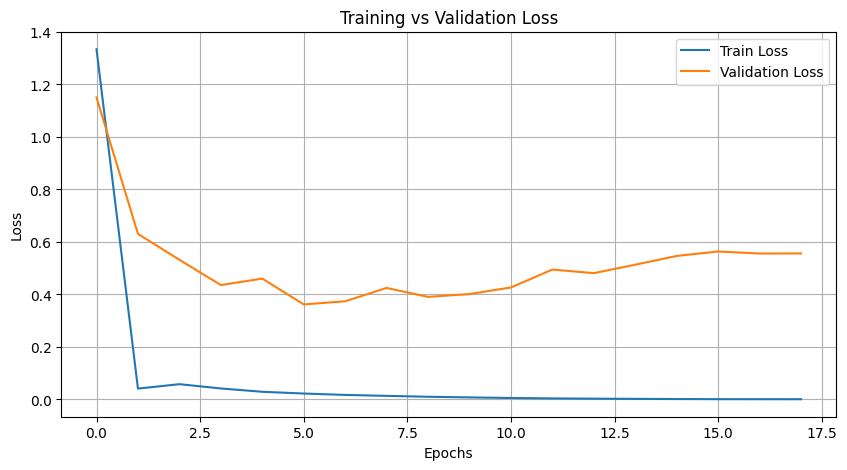

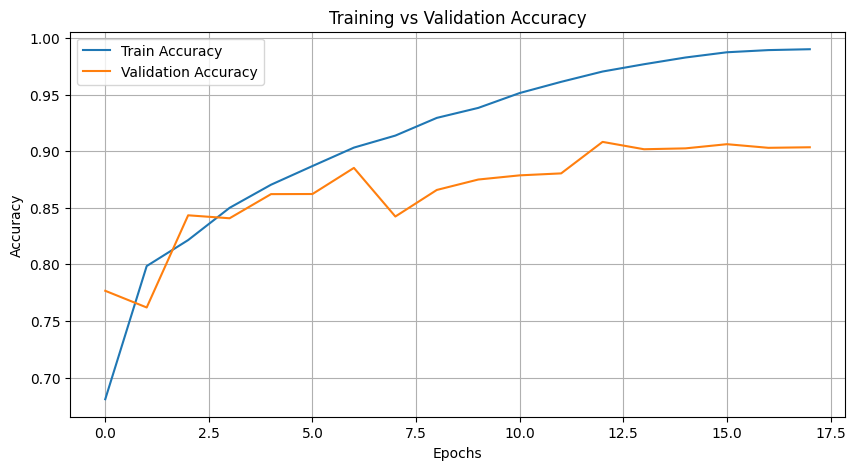

In [ ]:
import matplotlib.pyplot as plt

# Plot Training vs Validation Loss
plt.figure(figsize=(10, 5))
plt.plot(model.train_losses, label="Train Loss")
plt.plot(model.val_losses, label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid()
plt.show()

# Plot Training vs Validation Accuracy
plt.figure(figsize=(10, 5))
plt.plot(model.train_accuracies, label="Train Accuracy")
plt.plot(model.val_accuracies, label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training vs Validation Accuracy")
plt.legend()
plt.grid()
plt.show()

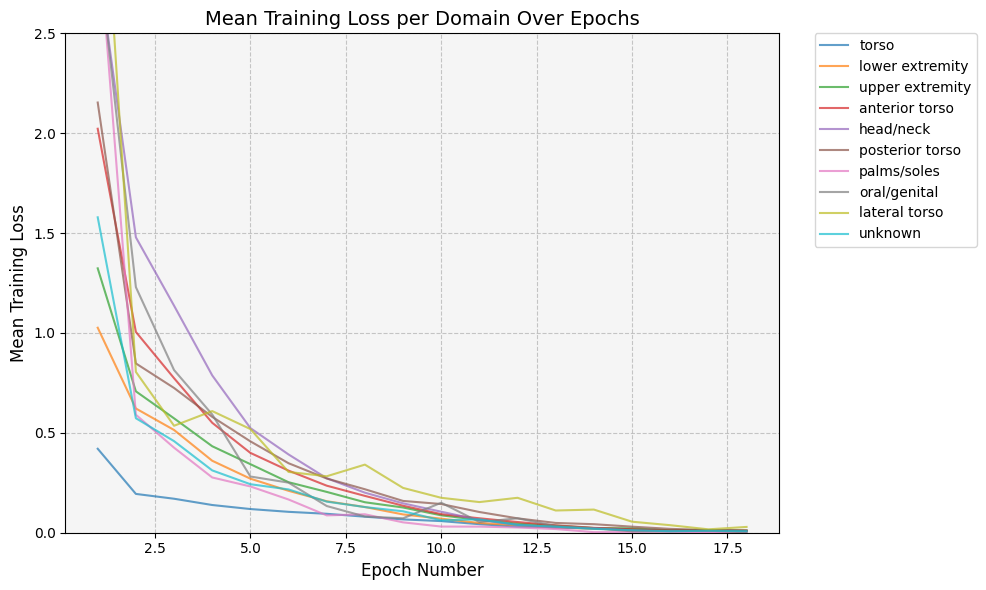

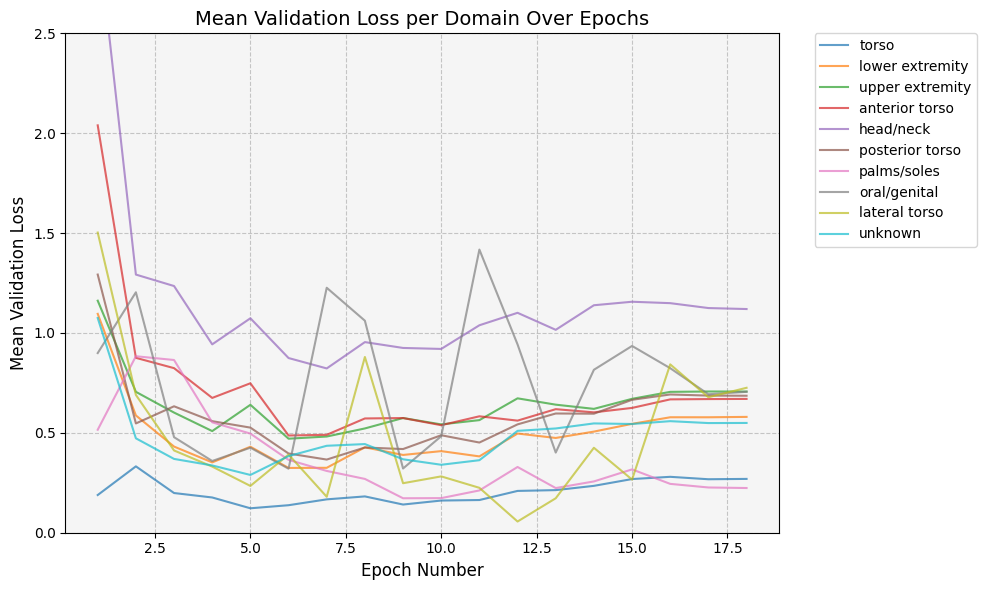

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt

# Map domain IDs to names
domain_id_to_name = {
    0: 'torso',
    1: 'lower extremity',
    2: 'upper extremity',
    3: 'anterior torso',
    4: 'head/neck',
    5: 'posterior torso',
    6: 'palms/soles',
    7: 'oral/genital',
    8: 'lateral torso',
    9: 'unknown'
}

# Plot Mean Training Loss per Domain Over Epochs
plt.figure(figsize=(10, 6))
for domain, losses in model.epoch_domain_train_losses.items():
    if losses:  # Only plot if there are losses
        plt.plot(range(1, len(losses) + 1), losses, label=domain_id_to_name[domain], alpha=0.7)

plt.xlabel('Epoch Number', fontsize=12)
plt.ylabel('Mean Training Loss', fontsize=12)
plt.title('Mean Training Loss per Domain Over Epochs', fontsize=14)
plt.ylim(0, 2.5)  # Set consistent y-axis range
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.gca().set_facecolor('#f5f5f5')
plt.show()

# Plot Mean Validation Loss per Domain Over Epochs (already present)
plt.figure(figsize=(10, 6))
for domain, losses in model.epoch_domain_val_losses.items():
    if losses:  # Only plot if there are losses
        plt.plot(range(1, len(losses) + 1), losses, label=domain_id_to_name[domain], alpha=0.7)

plt.xlabel('Epoch Number', fontsize=12)
plt.ylabel('Mean Validation Loss', fontsize=12)
plt.title('Mean Validation Loss per Domain Over Epochs', fontsize=14)
plt.ylim(0, 2.5)  # Set consistent y-axis range
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.gca().set_facecolor('#f5f5f5')
plt.show()
# After each plt.show(), add:
plt.savefig('mean_training_loss_per_domain.png', bbox_inches='tight', dpi=300)
plt.savefig('mean_validation_loss_per_domain.png', bbox_inches='tight', dpi=300)

Loading best checkpoint for testing: skin_lesion_model_dat_fixed/best_model.ckpt
Successfully loaded pre-trained weights for ViT: 86389248 parameters
Testing the model using BaseEvaluator...
Successfully loaded pre-trained weights for ViT: 86389248 parameters


<ipython-input-13-f0af395c91d0>:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(self.checkpoint_path, map_location=self.device)


Checkpoint loaded successfully!
Batch 1: Collected 16 predictions
Batch 2: Collected 16 predictions
Batch 3: Collected 16 predictions
Batch 4: Collected 16 predictions
Batch 5: Collected 16 predictions
Batch 6: Collected 16 predictions
Batch 7: Collected 16 predictions
Batch 8: Collected 16 predictions
Batch 9: Collected 16 predictions
Batch 10: Collected 16 predictions
Batch 11: Collected 16 predictions
Batch 12: Collected 16 predictions
Batch 13: Collected 16 predictions
Batch 14: Collected 16 predictions
Batch 15: Collected 16 predictions
Batch 16: Collected 16 predictions
Batch 17: Collected 16 predictions
Batch 18: Collected 16 predictions
Batch 19: Collected 16 predictions
Batch 20: Collected 16 predictions
Batch 21: Collected 16 predictions
Batch 22: Collected 16 predictions
Batch 23: Collected 16 predictions
Batch 24: Collected 16 predictions
Batch 25: Collected 16 predictions
Batch 26: Collected 16 predictions
Batch 27: Collected 16 predictions
Batch 28: Collected 16 predictio

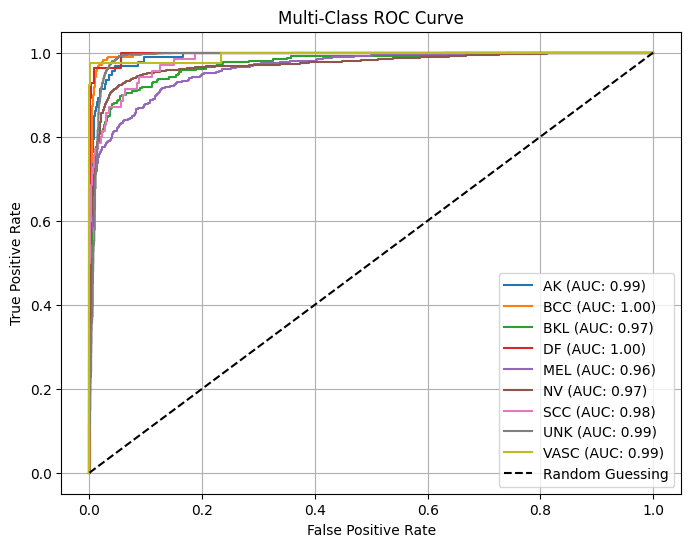

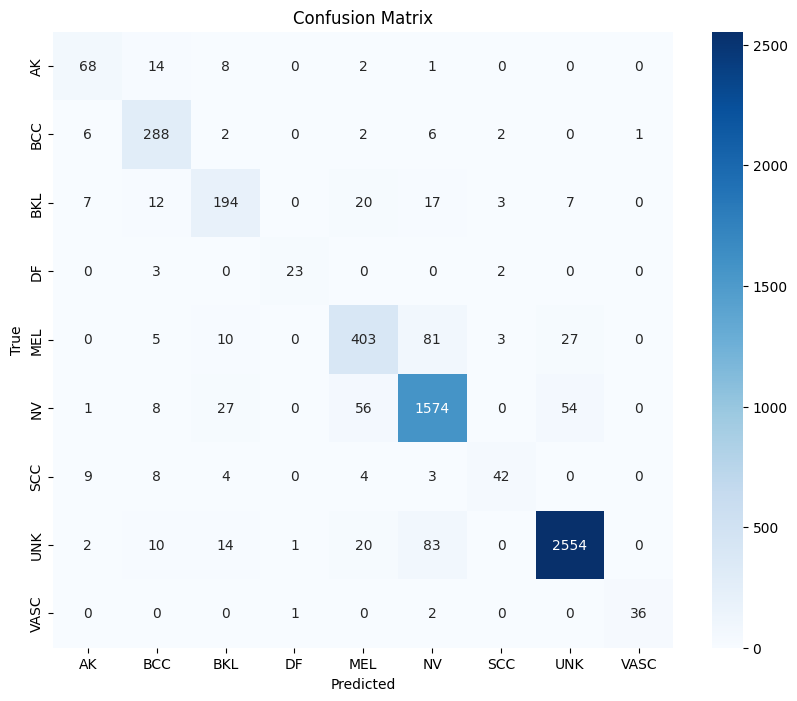


Plotting first 10 images with predictions:


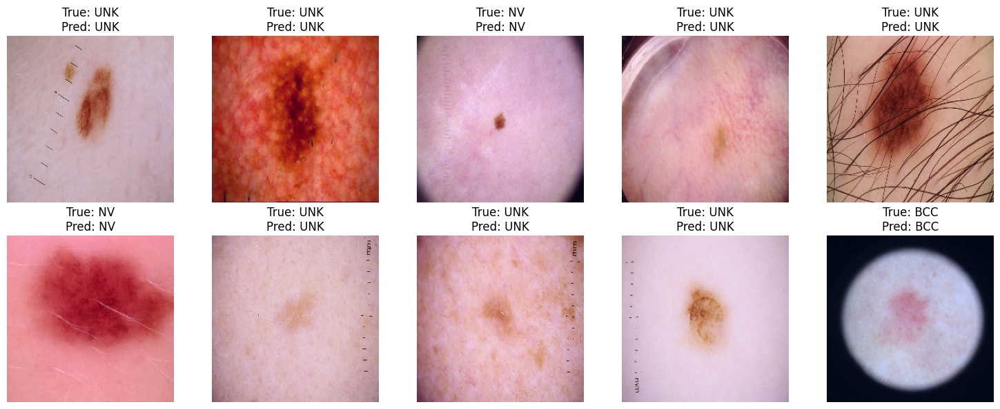

In [ ]:
Fbest_checkpoint_path = os.path.join(NET_FOLDER, f"{BEST_WEIGHTS_FILE}.ckpt")
if os.path.exists(best_checkpoint_path):
    print(f"Loading best checkpoint for testing: {best_checkpoint_path}")
    model = DomainAdaptiveViT.load_from_checkpoint(best_checkpoint_path)
    model.evaluator.checkpoint_path = best_checkpoint_path  # Set for evaluator if needed
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    model.eval()

    # Test the model (assuming test_dataloader is defined)
    print("Testing the model using BaseEvaluator...")
    # trainer.test(model, test_dataloader)  # Alternatively, use trainer.test
    model.evaluator.evaluate(test_dataloader)  # Direct call to evaluator
else:
    print(f"Best checkpoint not found at {best_checkpoint_path}. Cannot proceed with testing.")

In [ ]:
# Save the model's state dictionary
torch.save(model.state_dict(), "trained_model_dat_vit_fixed.pth")

In [ ]:
# Extract layer names
layer_names = [name for name, param in model.named_parameters()]
layer_names.reverse()  # Reverse to start from the last layers

# Print first few layers to verify
print("layer names (from the last layers):")
print(layer_names)

layer names (from the last layers):
['fc.bias', 'fc.weight', 'domain_adaptive_attention.proj.bias', 'domain_adaptive_attention.proj.weight', 'domain_adaptive_attention.domain_scaling.bias', 'domain_adaptive_attention.domain_scaling.weight', 'domain_adaptive_attention.value.bias', 'domain_adaptive_attention.value.weight', 'domain_adaptive_attention.key.bias', 'domain_adaptive_attention.key.weight', 'domain_adaptive_attention.query.bias', 'domain_adaptive_attention.query.weight', 'domain_embedding.weight', 'vit.pooler.dense.bias', 'vit.pooler.dense.weight', 'vit.layernorm.bias', 'vit.layernorm.weight', 'vit.encoder.layer.11.layernorm_after.bias', 'vit.encoder.layer.11.layernorm_after.weight', 'vit.encoder.layer.11.layernorm_before.bias', 'vit.encoder.layer.11.layernorm_before.weight', 'vit.encoder.layer.11.output.dense.bias', 'vit.encoder.layer.11.output.dense.weight', 'vit.encoder.layer.11.intermediate.dense.bias', 'vit.encoder.layer.11.intermediate.dense.weight', 'vit.encoder.layer.11.

In [ ]:
!pip install grad-cam
!pip install captum

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 55.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.4-py3-none-any.whl size=39680 sha256=8a8557fd83c16f0fbabeee1a715f972d347d51e6769ff096e1f277b1c0c1d73c
  Stored in directory: /root/.cache/pip/wheels/50/b0/82/1f97b5348c7fe9f0ce0ba18497202cafa5dec4562bd5292680
Successfully built grad-cam
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 19.4 MB/s eta 0:00:00


In [ ]:
from transformers import ViTModel
import os

# Verify pre-trained weights load
model = DomainAdaptiveViT(
    n_classes=9,
    domain_map=domain_map,  # Ensure defined
    class_weights_tensor=class_weights_tensor
)
vit = ViTModel.from_pretrained("google/vit-base-patch16-224")
print(f"ViT weights loaded: {sum(p.numel() for p in vit.parameters())} parameters")
model.vit = vit  # Explicitly assign

Successfully loaded pre-trained weights for ViT: 86389248 parameters


config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTModel were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized: ['vit.pooler.dense.bias', 'vit.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


ViT weights loaded: 86389248 parameters


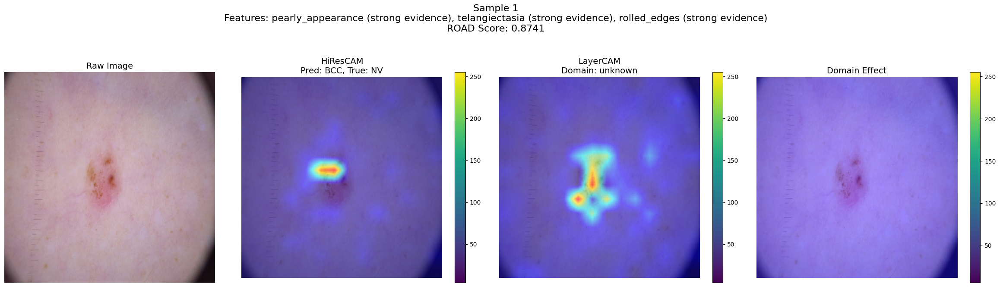

Sample 1: Predicted=BCC, True=NV, ROAD Score=0.8741, Domain=unknown


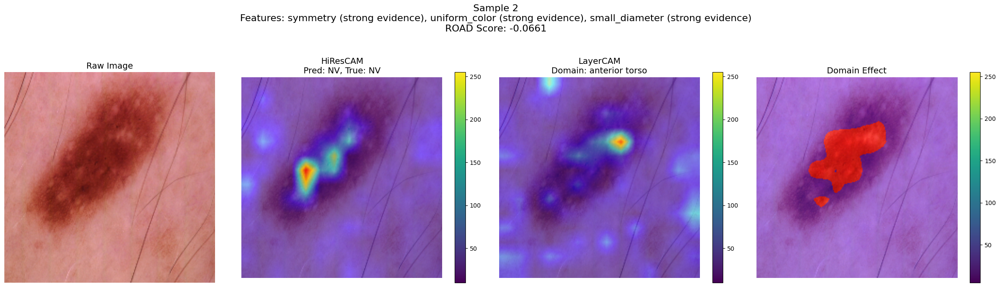

Sample 2: Predicted=NV, True=NV, ROAD Score=-0.0661, Domain=anterior torso


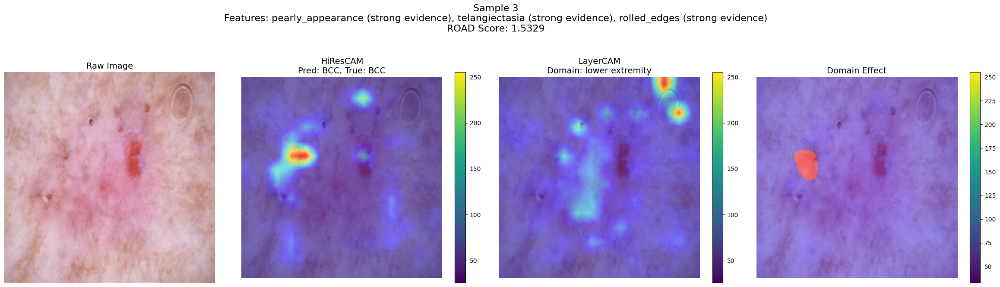

Sample 3: Predicted=BCC, True=BCC, ROAD Score=1.5329, Domain=lower extremity


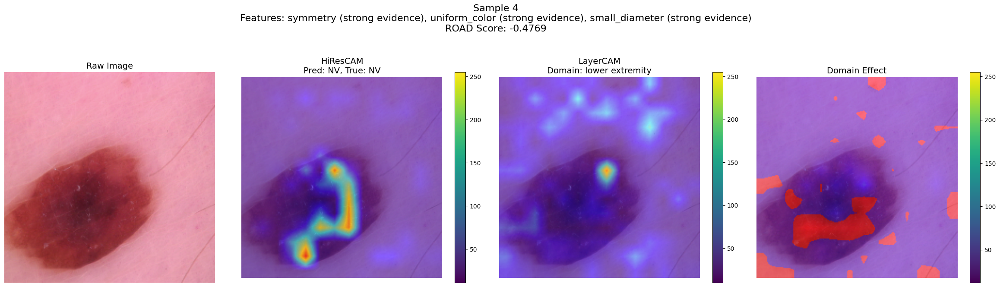

Sample 4: Predicted=NV, True=NV, ROAD Score=-0.4769, Domain=lower extremity


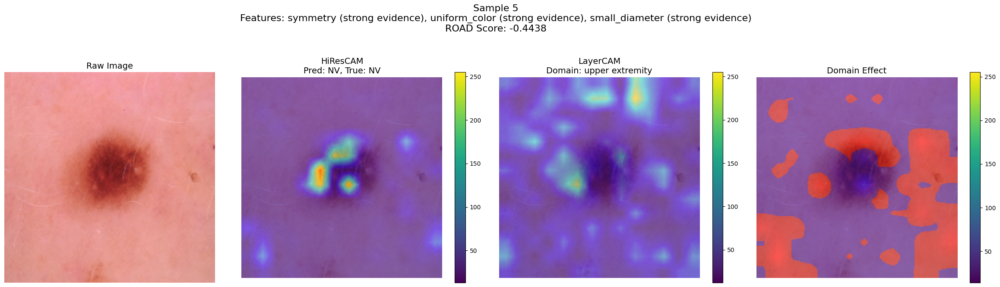

Sample 5: Predicted=NV, True=NV, ROAD Score=-0.4438, Domain=upper extremity


In [ ]:
# XAI Functions
def vit_reshape_transform(tensor, height=14, width=14):
    result = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.transpose(2, 3).transpose(1, 2)
    return result

def denormalize(img_tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = img_tensor.cpu().numpy().transpose(1, 2, 0)
    img = img * std + mean
    return np.clip(img, 0, 1)

class ModelWithDomain(nn.Module):
    def __init__(self, model, domain_id):
        super().__init__()
        self.model = model
        self.domain_id = domain_id

    def forward(self, x):
        if x.dim() == 3:
            x = x.unsqueeze(0)
        if self.domain_id is None:
            default_domain = torch.tensor([9], device=x.device)
            return self.model(x, default_domain)
        return self.model(x, self.domain_id)

def apply_xai(model, dataloader, num_samples=5):
    model.eval()
    device = next(model.parameters()).device
    targets = [ClassifierOutputTarget(i) for i in range(9)]
    road_metric = ROADMostRelevantFirst(percentile=75)
    target_layers_hires = [model.vit.encoder.layer[-1].layernorm_before]
    target_layers_layer = [model.vit.encoder.layer[0].layernorm_before]

    sample_count = 0
    for batch in dataloader:
        images, labels, domains = batch
        images = images.to(device)
        labels = labels.to(device)
        domains = domains.to(device)

        for i in range(len(images)):
            if sample_count >= num_samples:
                break

            image = images[i]
            label = labels[i].item()
            domain = domains[i].item()
            input_tensor = image.unsqueeze(0).to(device)
            domain_id = torch.tensor([domain], device=device)
            rgb_img = denormalize(image)

            model_with_domain = ModelWithDomain(model, domain_id)
            model_no_domain = ModelWithDomain(model, None)

            with HiResCAM(model=model_with_domain, target_layers=target_layers_hires, reshape_transform=vit_reshape_transform) as cam:
                hires_cam = cam(input_tensor=input_tensor, targets=targets, aug_smooth=True)
                pred_idx = torch.argmax(model_with_domain(input_tensor), dim=1).item()
                hires_vis = show_cam_on_image(rgb_img, hires_cam[0], use_rgb=True)

            with LayerCAM(model=model_with_domain, target_layers=target_layers_layer, reshape_transform=vit_reshape_transform) as cam:
                layer_cam = cam(input_tensor=input_tensor, targets=targets, aug_smooth=True)
                layer_vis = show_cam_on_image(rgb_img, layer_cam[0], use_rgb=True)

            with HiResCAM(model=model_no_domain, target_layers=target_layers_hires, reshape_transform=vit_reshape_transform) as cam:
                no_domain_cam = cam(input_tensor=input_tensor, targets=targets, aug_smooth=True)
                diff_cam = hires_cam[0] - no_domain_cam[0]
                diff_vis = show_cam_on_image(rgb_img, diff_cam, use_rgb=True)

            road_scores = road_metric(input_tensor, hires_cam, targets, model_with_domain)
            road_score_mean = road_scores.mean() if road_scores.size else 0.0

            pred_class = class_names[pred_idx]
            true_class = class_names[label]
            features_detected = []
            cam_max = hires_cam[0].max().item()
            threshold = min(0.3, cam_max * 0.5)
            for feature in ontology[pred_class]:
                if cam_max > threshold:
                    confidence = "strong" if cam_max > 0.7 else "moderate"
                    features_detected.append(f"{feature} ({confidence} evidence)")

            domain_name = list(domain_map.keys())[list(domain_map.values()).index(domain)]

            plt.figure(figsize=(24, 6))
            plt.subplot(1, 4, 1)
            plt.imshow(rgb_img)
            plt.title("Raw Image", fontsize=14)
            plt.axis('off')
            plt.subplot(1, 4, 2)
            plt.imshow(hires_vis)
            plt.title(f"HiResCAM\nPred: {pred_class}, True: {true_class}", fontsize=14)
            plt.axis('off')
            plt.colorbar()
            plt.subplot(1, 4, 3)
            plt.imshow(layer_vis)
            plt.title(f"LayerCAM\nDomain: {domain_name}", fontsize=14)
            plt.axis('off')
            plt.colorbar()
            plt.subplot(1, 4, 4)
            plt.imshow(diff_vis)
            plt.title("Domain Effect", fontsize=14)
            plt.axis('off')
            plt.colorbar()
            plt.suptitle(
                f"Sample {sample_count+1}\n"
                f"Features: {', '.join(features_detected) if features_detected else 'None'}\n"
                f"ROAD Score: {road_score_mean:.4f}",
                fontsize=16, y=1.1
            )
            plt.tight_layout()
            plt.show()

            print(f"Sample {sample_count+1}: Predicted={pred_class}, True={true_class}, ROAD Score={road_score_mean:.4f}, Domain={domain_name}")
            sample_count += 1
        if sample_count >= num_samples:
            break

apply_xai(evaluator.model, test_dataloader, num_samples=5)